In [3]:
import scanpy as sc
import anndata as ad
import hdf5plugin
import os
import numpy as np
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# --- Configuration ---
# Define the root analysis path
ROOT_ANALYSIS_PATH = r"/Users/jacobng/Research/cai/wu_project/"

# Define the specific directory where the merged file is located (and where the output should go)
# This aligns with the 'ROOT_CB_OUTPUT_DIR' from the previous merging script.
INDIVIDUAL_SAMPLES_DIR = os.path.join(ROOT_ANALYSIS_PATH, 'individual_cellbender_samples')

# Change working directory to the target folder for reading/writing
os.chdir(INDIVIDUAL_SAMPLES_DIR)
print(f"Current Working Directory set to: {os.getcwd()}")

# File names (now relative to CWD)
FILE_NAME = 'iec_wu_scdc_cellbender_merged_qc_processed_ann.h5ad'
batch_key = 'batch_id' 
fname_filtered = FILE_NAME

try:
    final_adata = sc.read_h5ad(fname_filtered)
    print(f"Loaded merged AnnData: {final_adata}")
except FileNotFoundError:
    print(f"Error: Merged input file not found at {fname_filtered} in the current directory.")
    exit()

Current Working Directory set to: /Users/jacobng/Research/cai/wu_project/individual_cellbender_samples
Loaded merged AnnData: AnnData object with n_obs × n_vars = 202750 × 16430
    obs: 'batch_id', 'Diet', 'SampleID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_global_harmony_1.0', 'Genotype_Diet', 'leiden_res_0.50', 'leiden_res_0.70', 'leiden_res_1.00', 'leiden_res_1.50', 'leiden_res_2.00', 'cell_type_clusters_leiden_res_1.00', 'cell_type_lvl1', 'broad_cell_types'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'to

In [4]:
idx = final_adata.obs['broad_cell_types'] == "Colonocytes" # Should I change to goblet cells?
final_adata = final_adata[idx,:].copy()
final_adata

AnnData object with n_obs × n_vars = 163926 × 16430
    obs: 'batch_id', 'Diet', 'SampleID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_global_harmony_1.0', 'Genotype_Diet', 'leiden_res_0.50', 'leiden_res_0.70', 'leiden_res_1.00', 'leiden_res_1.50', 'leiden_res_2.00', 'cell_type_clusters_leiden_res_1.00', 'cell_type_lvl1', 'broad_cell_types'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'd

In [5]:
#sc.pp.highly_variable_genes(final_adata, n_top_genes=2000, batch_key="SampleID")# Flavor seurat
sc.pp.highly_variable_genes(final_adata, n_top_genes=2000)# Flavor seurat

#sc.pl.highly_variable_genes(adata, save="_hvgs_mean_disper.svg")
npca = 50

use_hvg = final_adata.var['highly_variable'].sum() > 0
if final_adata.n_obs > 20000:
    print(f"PCA analysis in chunks of 10000 cells (n_comps={npca})...")
    sc.tl.pca(final_adata, n_comps=npca, mask_var="highly_variable", chunked=True, chunk_size=10000, svd_solver="arpack")
else:
    print(f"PCA analysis (n_comps={npca})...")
    sc.tl.pca(final_adata, n_comps=npca, mask_var="highly_variable", chunked=False, svd_solver="arpack")

PCA analysis in chunks of 10000 cells (n_comps=50)...


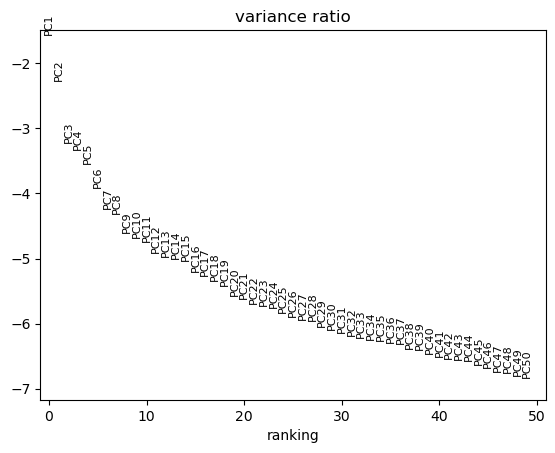

In [6]:
sc.pl.pca_variance_ratio(final_adata, n_pcs=npca, log=True)

In [7]:
import harmonypy as hp
import pandas as pd

# 1. Extract the PCA matrix
data_mat = final_adata.obsm['X_pca']

# 2. Run harmony directly
ho = hp.run_harmony(data_mat, final_adata.obs, 'SampleID')
print(f"X_pca shape: {final_adata.obsm['X_pca'].shape}")
print(f"X_pca_harmony shape: {ho.Z_corr.shape}")

# 3. Transpose and assign manually 
# Harmony returns (PCs x Cells), Scanpy expects (Cells x PCs)
final_adata.obsm['X_pca_harmony'] = ho.Z_corr

2026-02-17 16:46:33,570 - harmonypy - INFO - Running Harmony (PyTorch on mps)
2026-02-17 16:46:33,571 - harmonypy - INFO -   Parameters:
2026-02-17 16:46:33,572 - harmonypy - INFO -     max_iter_harmony: 10
2026-02-17 16:46:33,572 - harmonypy - INFO -     max_iter_kmeans: 20
2026-02-17 16:46:33,574 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-02-17 16:46:33,574 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-02-17 16:46:33,575 - harmonypy - INFO -     nclust: 100
2026-02-17 16:46:33,576 - harmonypy - INFO -     block_size: 0.05
2026-02-17 16:46:33,577 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-02-17 16:46:33,578 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-02-17 16:46:33,579 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-02-17 16:46:33,580 - harmonypy - INFO -     verbose: True
2026-02-17 16:46:33,581 - harmonypy - INFO -     random_state: 0
2026-02-17 16:46:33,582 - harmonypy - INFO -

X_pca shape: (163926, 50)
X_pca_harmony shape: (163926, 50)


In [8]:
# --- Custom Parameters ---
ndim = 2           # Number of UMAP dimensions
n_neighbors = 15   # Number of neighbors for the graph
my_res = 1.0       # Clustering resolution (changed from 2.0 to 1.0 as requested)
algo_cluster = "leidenalg"
npca = 50

# 5. Neighbors and UMAP (Step 8)
# This step uses the 50-component PCA result (final_adata.obsm['X_pca'])
print(f"Computing nearest neighbors (k={n_neighbors}) and UMAP (n_dims={ndim})...")
sc.pp.neighbors(final_adata, n_neighbors=n_neighbors, use_rep = "X_pca_harmony", n_pcs=npca, key_added="neighboars_harmony")
sc.pp.neighbors(final_adata, n_neighbors=n_neighbors, use_rep = "X_pca", n_pcs=npca) # Stored in neighboars

sc.tl.umap(final_adata, n_components=ndim, neighbors_key= "neighboars_harmony", maxiter=500)
final_adata.obsm['X_umap_harmony'] = final_adata.obsm['X_umap'] 
sc.tl.umap(final_adata, n_components=ndim, maxiter=500)
final_adata.obsm['X_umap_normal'] = final_adata.obsm['X_umap'] 
final_adata.obsm['X_umap'] = final_adata.obsm['X_umap_harmony'] 

Computing nearest neighbors (k=15) and UMAP (n_dims=2)...


In [9]:
# 6. Global Leiden Clustering (Replacing Batch-Aware Clustering)
# This runs Leiden once on the entire graph structure computed from the 50 PCs.
cluster_key = f'leiden_global_{my_res}' # Renamed key to reflect global clustering
print(f"\nComputing **Global** Leiden clusters (res={my_res}, flavor={algo_cluster}) on all {final_adata.n_obs} cells...")

# sc.tl.leiden(
#     final_adata,
#     flavor=algo_cluster,
#     n_iterations=2, # Use n_iterations=2 as in the previous code
#     resolution=my_res,
#     key_added=cluster_key
# )
# print(f"Global Leiden clustering complete. Results in adata.obs['{cluster_key}']")

cluster_key = f'leiden_global_harmony_{my_res}' # Renamed key to reflect global clustering
print(f"\nComputing **Global** Leiden clusters (res={my_res}, flavor={algo_cluster}) on all {final_adata.n_obs} cells...")
sc.tl.leiden(
    final_adata,
    flavor=algo_cluster,
    n_iterations=2, # Use n_iterations=2 as in the previous code
    resolution=my_res,
    key_added=cluster_key,
    neighbors_key = "neighboars_harmony"
)

# 7. Plot and Save UMAP
#print(f"\nPlotting UMAP colored by {cluster_key} and saving...")
#sc.set_figure_params(figsize=(8, 8)) 
#sc.pl.umap(final_adata, color=[cluster_key], show=False, save=f"_umap_leiden_global.svg")
#sc.pl.umap(final_adata, color=[cluster_key], show=False, save=f"_umap_harmony_leiden_global.svg")

# The final H5AD save (Step 8) will automatically include all new results.


Computing **Global** Leiden clusters (res=1.0, flavor=leidenalg) on all 163926 cells...

Computing **Global** Leiden clusters (res=1.0, flavor=leidenalg) on all 163926 cells...


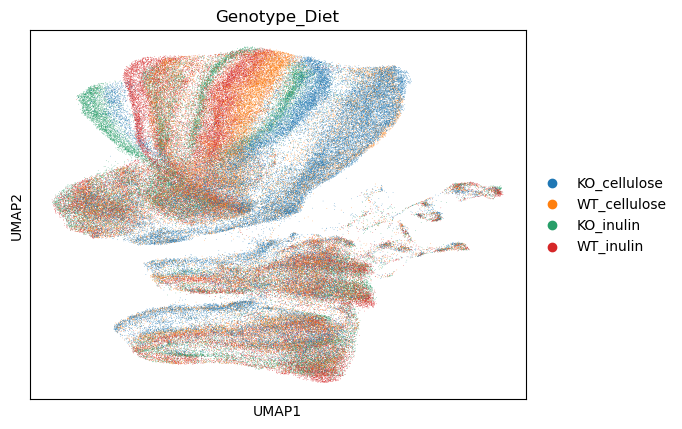

In [11]:
# sc.set_figure_params(figsize=(5, 5)) 
final_adata.obsm['X_umap'] = final_adata.obsm['X_umap_normal'] 
sc.pl.umap(
    final_adata, color=['Genotype_Diet'],
    wspace=0.1, 
    save = "_sub_cell_types_n_batches_colonocytes.svg" 
)

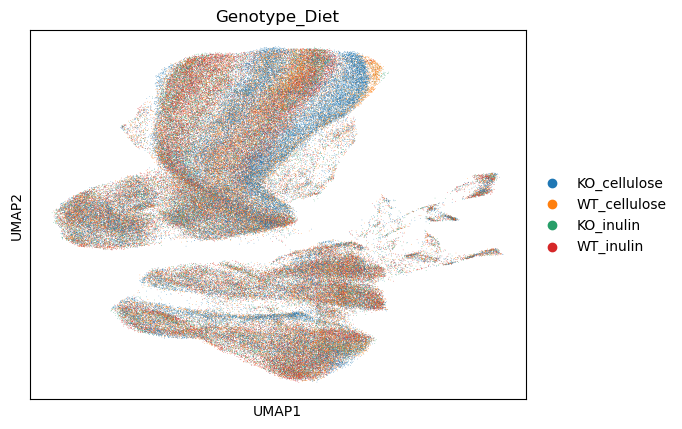

In [12]:
# sc.set_figure_params(figsize=(5, 5)) 
final_adata.obsm['X_umap'] = final_adata.obsm['X_umap_harmony'] 
sc.pl.umap(
    final_adata, color=['Genotype_Diet'],
    wspace=0.1, 
    save = "_sub_cell_types_n_batches_harmony_colonocytes.svg" 
)

In [13]:
ndim = 2           # Number of UMAP dimensions
n_neighbors = 15   # Number of neighbors for the graph
algo_cluster = "leidenalg"

for res in [ 0.5, 0.7, 1.0, 1.5, 2.0, 2.5, 3.0]:
    sc.tl.leiden(final_adata, flavor=algo_cluster, n_iterations=2, resolution=res, key_added=f"leiden_res_{res:4.2f}", neighbors_key = "neighboars_harmony")

In [14]:
# Sub annotation of colonocytes
marker_genes = {
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes": ["Alpi", "Ces2c", "Slc26a2", "Ceacam1", "Aqp8"],
    "Goblet cells": ["Muc2", "Spink4", "Agr2", "Tff3"],
    "Enteroendocrine": ["Chga", "Chgb", "Tph1", "Cck", "Scgn", "Scg5"],
    "Tuft cells": ["Dclk1", "Trpm5", "Avil", "Sh2d6", "Plcg2"],
    "TA cells": ["Mki67", "Top2a", "Birc5", "Pcna", "Stmn1"],
    "Stem cells": ["Lgr5", "Lrig1", "Ascl2", "Slc12a2", "Smoc2", "Kcnq1", "Gpx2",  "Ephb2", "Bmpr1a", "Hopx", "Sox9"],
    #"Mast cells": ["Ms4a2", "Cpa3", "Tpsab1", "Hpgds"],
    #"Adipocytes": ["Adipoq", "Plin1", "Plin4"],
}


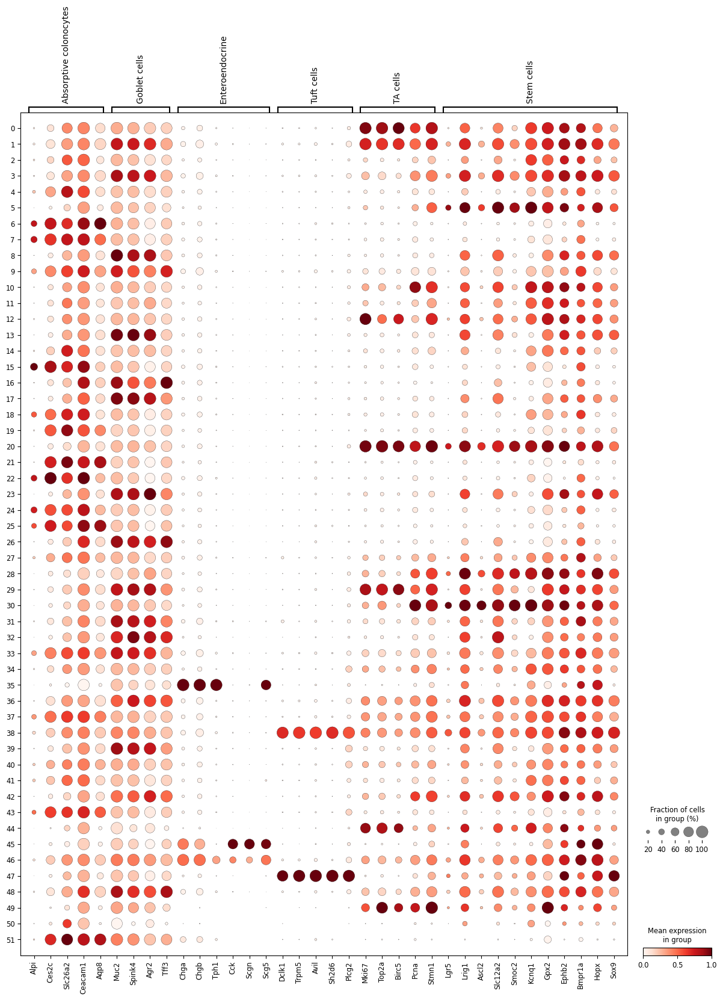

In [15]:
res = 2.5
cluster_key = f"leiden_res_{res:4.2f}"

sc.pl.dotplot(final_adata, marker_genes, #cmap='viridis', 
              groupby=cluster_key, standard_scale="var", save=f'_dotplot_markers_colonocytes_{cluster_key}.svg')

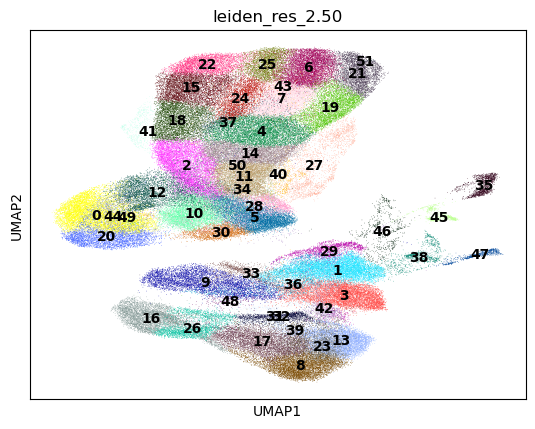

In [17]:
# sc.set_figure_params(figsize=(8, 8)) 
sc.pl.umap(
    final_adata, color=[cluster_key],
    legend_loc="on data",
    save = f"_cell_types_clusters_{cluster_key}_colonocytes.svg" )

In [18]:
#res = 2.5
#cluster_key = f"leiden_res_{res:4.2f}"
level_ann = f"cell_type_clusters_{cluster_key}"
final_adata.obs[level_ann] = final_adata.obs[cluster_key].map(
    {
        "0": "Goblet cells",
        "1": "TA cells", 
        "2": "Absorptive colonocytes", 
        "3": "Goblet cells",
        "4": "Goblet cells",
        "5": "Absorptive colonocytes",
        "6": "Absorptive colonocytes",
        "7": "Absorptive colonocytes",
        "8": "Goblet cells", 
        "9": "Goblet cells", 
        "10": "TA cells",
        "11": "Absorptive colonocytes",
        "12": "Absorptive colonocytes", # Stem or abs col
        "13": "Goblet cells",
        "14": "Absorptive colonocytes", 
        "15": "Stem cells",
        "16": "TA cells",
        "17": "Stem cells",
        "18": "Stem cells",
        "19": "Absorptive colonocytes",
        "20": "Absorptive colonocytes",
        "21": "TA cells",
        "22": "TA cells",
        "23": "Absorptive colonocytes",
        "24": "Absorptive colonocytes",
        "25": "Goblet cells",
        "26": "Goblet cells",
        "27": "Absorptive colonocytes", 
        "28": "Absorptive colonocytes",
        "29": "Absorptive colonocytes",  
        "30": "Goblet cells",
        "31": "Goblet cells",
        "32": "Goblet cells",
        "33": "Goblet cells",
        "34": "Goblet cells",
        "35": "Stem cells", # stem or abs col
        "36": "Goblet cells",
        "37": "Enteroendocrine",
        "38": "Goblet cells", 
        "39": "Absorptive colonocytes", 
        "40": "Tuft cells", 
        "41": "Absorptive colonocytes",
        "42": "Goblet cells",
        "43": "Absorptive colonocytes", 
        "44": "Goblet cells",
        "45": "Absorptive colonocytes",
        "46": "Enteroendocrine",
        "47": "Enteroendocrine",
        "48": "Tuft cells",
        "49": "Goblet cells",
        "50": "TA cells",
        "51": "Absorptive colonocytes",
        "52": "Absorptive colonocytes",
    }
)

In [19]:
# Display the resulting annotation and the top scores
print("\n--- New Cell Type Annotation Counts ---")
annotation_summary_df = summarize_annotations(final_adata, level_ann)

sc.set_figure_params(figsize=(8, 8)) 
sc.pl.umap(
    final_adata, color=[level_ann],
    save = "_cell_types_clusters_cust_ann_colonocytes.svg" )



--- New Cell Type Annotation Counts ---


NameError: name 'summarize_annotations' is not defined

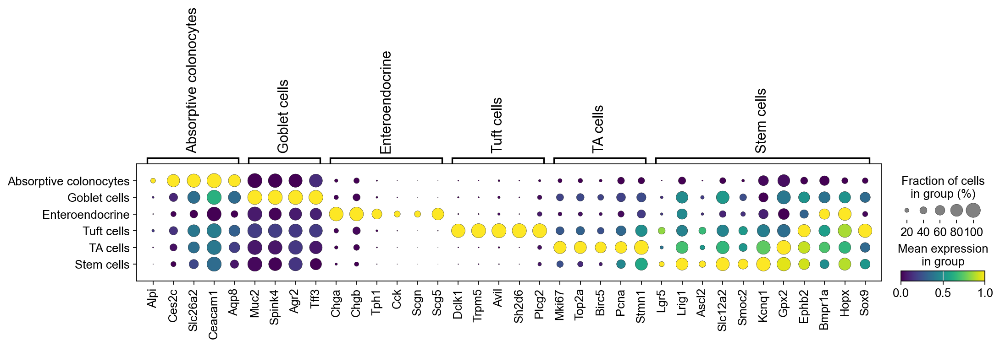

Dot plot categories for cell_type_clusters_leiden_res_2.50 reordered successfully with diagonal alignment.


In [37]:
import pandas as pd
import numpy as np
import scanpy as sc

# --- 2. Define the Custom Sort Order for SINGLE/LVL2 (Y-axis order) ---
# NOTE: This should be a list or tuple for ordered categories, not a set (curly braces used here denote a set, which is unordered).
custom_single_category_order = [
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes",
    "Goblet cells",
    "Enteroendocrine",
    "Tuft cells",
    "TA cells",
    "Stem cells",
]

# ==========================================================
# NEW SORTING AND PLOTTING FOR cell_type_lvl (SINGLE)
# ==========================================================
res = 2.5
level_ann = level_ann
cluster_key = f"leiden_res_{res:4.2f}"

# --- 5. Filter the Order to Match Existing Categories (LVL) ---
existing_categories_lvl = final_adata.obs[level_ann].cat.categories.tolist()
filtered_lvl_order = [cat for cat in custom_single_category_order if cat in existing_categories_lvl]

# Check for categories in the data that were missed in the custom list
missing_categories_lvl = [cat for cat in existing_categories_lvl if cat not in filtered_lvl_order]
if missing_categories_lvl:
    print(f"Warning (lvl): The following categories were not included in the custom sort list and will appear last: {missing_categories_lvl}")
    filtered_lvl_order.extend(missing_categories_lvl)


# --- 6. Apply the New Category Order to the obs column (LVL) ---
final_adata.obs[level_ann] = final_adata.obs[level_ann].cat.reorder_categories(filtered_lvl_order)

# --- 7. Plot the Data (LVL) ---
sc.pl.dotplot(
    final_adata, 
    marker_genes,  # Pass the dictionary to group and order the X-axis genes
    cmap='viridis', 
    groupby=level_ann, 
    standard_scale="var", 
    categories_order=custom_single_category_order,
    save=f'_dotplot_markers_colonocytes_{level_ann}.svg'
)

print(f"Dot plot categories for {level_ann} reordered successfully with diagonal alignment.")

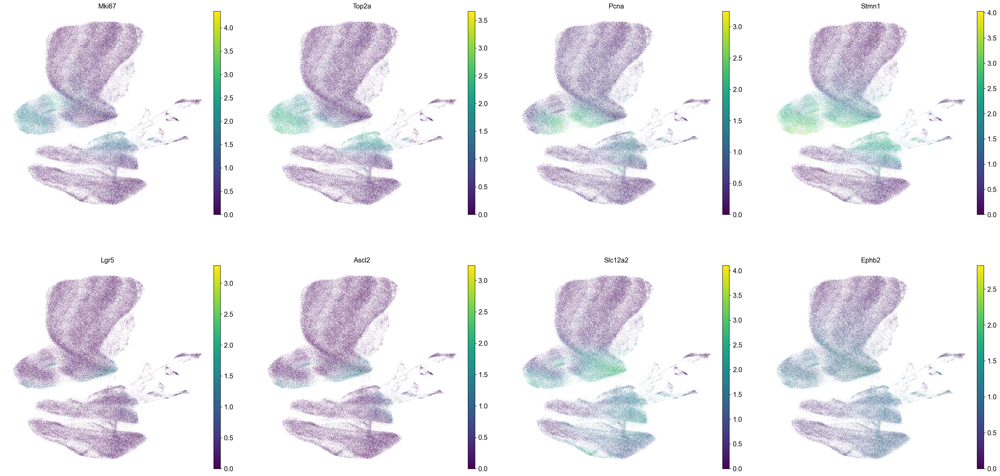

In [21]:
sc.pl.umap(
    final_adata, 
    color=["Mki67", "Top2a", "Pcna", "Stmn1", "Lgr5", "Ascl2", "Slc12a2", "Ephb2"], 
    use_raw=False,
    frameon=False,
    ncols=4,
    save='_ta_stem_gene_markers.svg' # Organize the plots into 2 columns
)


--- New Cell Type Annotation Counts ---

--- Annotation Summary for 'cell_type_lvl1' ---
                        Count Percentage
cell_type_lvl1                          
Absorptive colonocytes  52768     32.19%
Goblet cells            46391     28.30%
TA cells                37266     22.73%
Stem cells              17460     10.65%
Enteroendocrine          7181      4.38%
Tuft cells               2860      1.74%

--- Top 5 Cell Scores per Cluster ---
    leiden_res_2.50  Rank               Cell_Type  Mean_Weighted_Score
0                26     1            Goblet cells             0.902790
1                26     2  Absorptive colonocytes            -0.045327
2                26     3              Tuft cells            -0.054358
3                26     4         Enteroendocrine            -0.059966
4                26     5              Stem cells            -0.077589
..              ...   ...                     ...                  ...
260              52     1  Absorptive colonocy

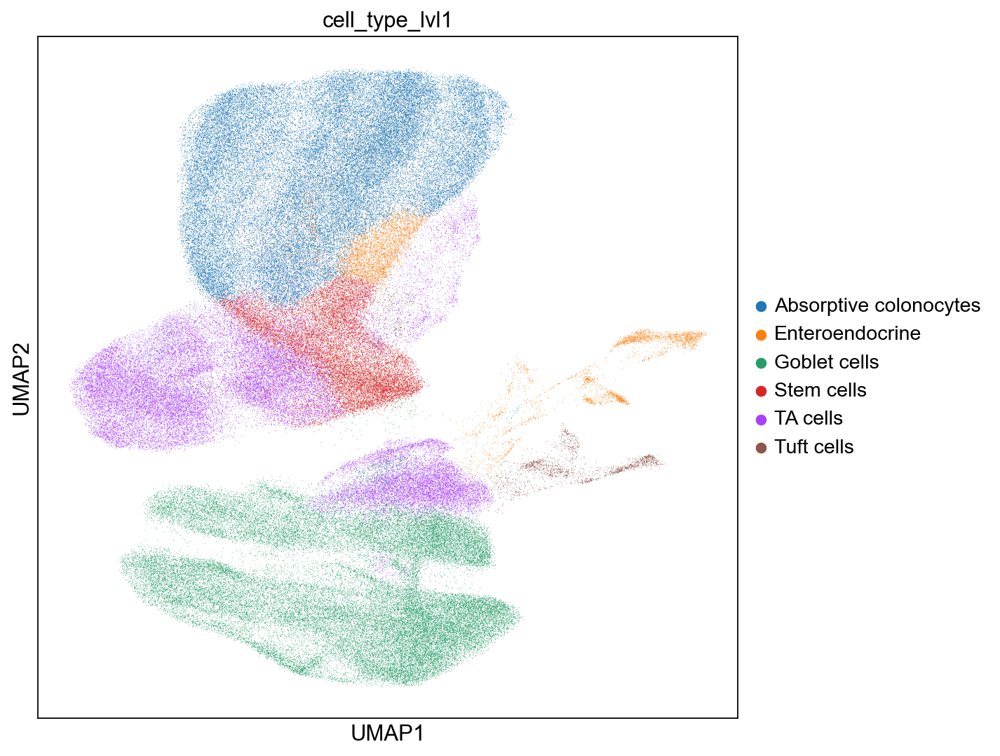

In [32]:
#[ 0.2, 0.5, 0.7, 1.0]
res = 2.5
level_ann = "cell_type_lvl1"
cluster_key = f"leiden_res_{res:4.2f}"
# The actual call to execute the scoring and annotation:
final_adata, top5_df = weighted_annotation_score(
    adata=final_adata, 
    marker_genes=marker_genes, 
    cluster_key = cluster_key, 
    obs_key_string=level_ann,
    standardize_expression=True
)

# Display the resulting annotation and the top scores
print("\n--- New Cell Type Annotation Counts ---")
annotation_summary_df = summarize_annotations(final_adata, level_ann)

print("\n--- Top 5 Cell Scores per Cluster ---")
print(top5_df)
sc.set_figure_params(figsize=(8, 8)) 
sc.pl.umap(
    final_adata, color=[level_ann],
    save = "_cell_types_clusters_level3_colonocytes.svg" )

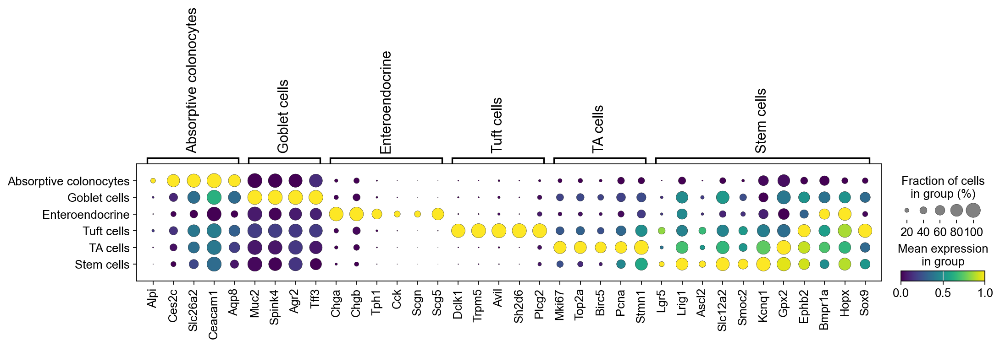

Dot plot categories for cell_type_clusters_leiden_res_2.50 reordered successfully with diagonal alignment.


In [36]:
import pandas as pd
import numpy as np
import scanpy as sc

# --- 2. Define the Custom Sort Order for SINGLE/LVL2 (Y-axis order) ---
# NOTE: This should be a list or tuple for ordered categories, not a set (curly braces used here denote a set, which is unordered).
custom_single_category_order = [
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes",
    "Goblet cells",
    "Enteroendocrine",
    "Tuft cells",
    "TA cells",
    "Stem cells",
]

# ==========================================================
# NEW SORTING AND PLOTTING FOR cell_type_lvl (SINGLE)
# ==========================================================
res = 2.5
level_ann = level_ann
cluster_key = f"leiden_res_{res:4.2f}"

# --- 5. Filter the Order to Match Existing Categories (LVL) ---
existing_categories_lvl = final_adata.obs[level_ann].cat.categories.tolist()
filtered_lvl_order = [cat for cat in custom_single_category_order if cat in existing_categories_lvl]

# Check for categories in the data that were missed in the custom list
missing_categories_lvl = [cat for cat in existing_categories_lvl if cat not in filtered_lvl_order]
if missing_categories_lvl:
    print(f"Warning (lvl): The following categories were not included in the custom sort list and will appear last: {missing_categories_lvl}")
    filtered_lvl_order.extend(missing_categories_lvl)


# --- 6. Apply the New Category Order to the obs column (LVL) ---
final_adata.obs[level_ann] = final_adata.obs[level_ann].cat.reorder_categories(filtered_lvl_order)

# --- 7. Plot the Data (LVL) ---
sc.pl.dotplot(
    final_adata, 
    marker_genes,  # Pass the dictionary to group and order the X-axis genes
    cmap='viridis', 
    groupby=level_ann, 
    standard_scale="var", 
    categories_order=custom_single_category_order,
    save=f'_dotplot_markers_colonocytes_{level_ann}.svg'
)

print(f"Dot plot categories for {level_ann} reordered successfully with diagonal alignment.")

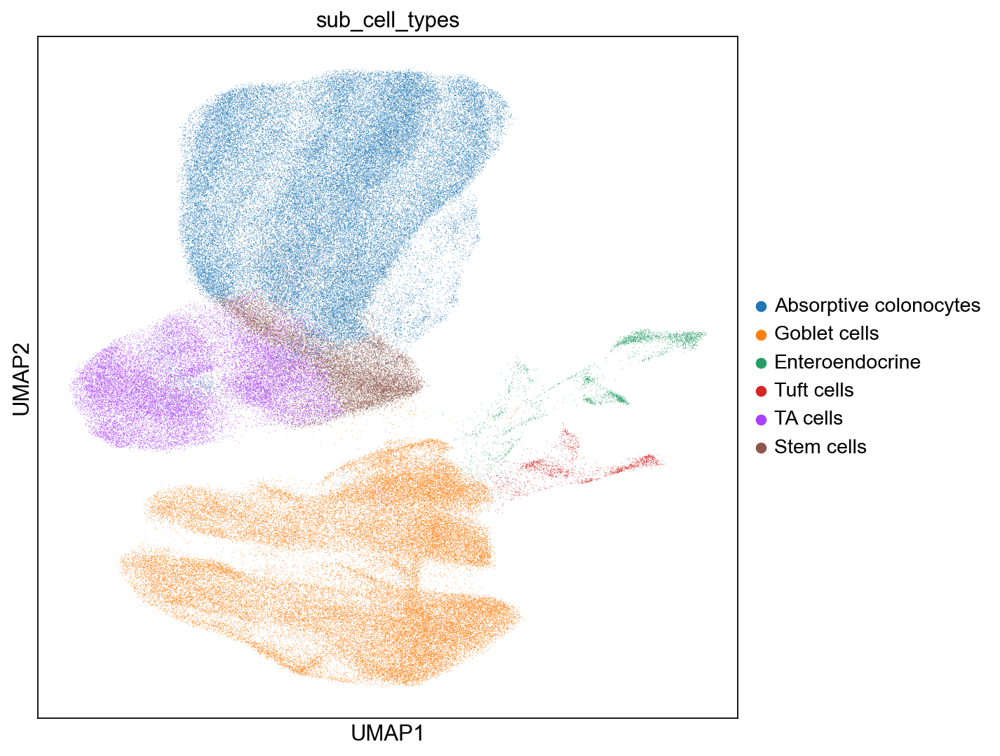

In [35]:
level_ann = f"cell_type_clusters_{cluster_key}"

final_adata.obs['sub_cell_types'] = final_adata.obs[level_ann]

sc.pl.umap(
    final_adata, color=['sub_cell_types'],
    save = "_cell_types_clusters_cust_colonocytes.svg" )

In [26]:
final_adata.obs['CellType'] = final_adata.obs['sub_cell_types']
final_adata.obs['BatchID'] = final_adata.obs['batch_id']

In [27]:
# Sub annotation of colonocytes
marker_genes = {
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes": ["Alpi", "Ces2c", "Slc26a2", "Ceacam1", "Aqp8"],
    "Goblet cells": ["Muc2", "Spink4", "Agr2", "Tff3"],
    "Enteroendocrine": ["Chga", "Chgb", "Tph1", "Cck", "Scgn", "Scg5"],
    "Tuft cells": ["Dclk1", "Trpm5", "Avil", "Sh2d6", "Plcg2"],
    "TA cells": ["Mki67", "Top2a", "Birc5", "Pcna", "Stmn1"],
    "Stem cells": ["Lgr5", "Lrig1", "Ascl2", "Slc12a2", "Smoc2", "Kcnq1", "Gpx2", "Sox9",  "Ephb2", "Bmpr1a", "Hopx", 'Gp2', 'Ccl20'],
    #"Mast cells": ["Ms4a2", "Cpa3", "Tpsab1", "Hpgds"],
}


In [28]:
print(final_adata)
FILE_NAME = 'iec_wu_scdc_merged_qc_processed_ann_colonocytes.h5ad'
print(f"\nSaving final broad cell type annotation AnnData to {FILE_NAME}")
final_adata.write_h5ad( FILE_NAME, compression=hdf5plugin.FILTERS["zstd"] )

AnnData object with n_obs × n_vars = 163926 × 16430
    obs: 'batch_id', 'Diet', 'SampleID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_global_harmony_1.0', 'Genotype_Diet', 'leiden_res_0.50', 'leiden_res_0.70', 'leiden_res_1.00', 'leiden_res_1.50', 'leiden_res_2.00', 'cell_type_clusters_leiden_res_1.00', 'cell_type_lvl1', 'broad_cell_types', 'leiden_res_2.50', 'leiden_res_3.00', 'cell_type_clusters_leiden_res_2.50', 'sub_cell_types', 'CellType', 'BatchID'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_count

In [38]:
import scanpy as sc
import anndata as ad
import hdf5plugin
import os
import numpy as np
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# --- Configuration ---
# Define the root analysis path
ROOT_ANALYSIS_PATH = r"Z:\selim_working_dir\2025_wu_iec_project\scanpy_process\individual_files_process"

# Define the specific directory where the merged file is located (and where the output should go)
# This aligns with the 'ROOT_CB_OUTPUT_DIR' from the previous merging script.
INDIVIDUAL_SAMPLES_DIR = os.path.join(ROOT_ANALYSIS_PATH, 'individual_cellbender_samples')

# Change working directory to the target folder for reading/writing
os.chdir(INDIVIDUAL_SAMPLES_DIR)
print(f"Current Working Directory set to: {os.getcwd()}")

# File names (now relative to CWD)
FILE_NAME = 'iec_wu_scdc_merged_qc_processed_ann_colonocytes.h5ad'
batch_key = 'batch_id' 
fname_filtered = FILE_NAME

try:
    final_adata = sc.read_h5ad(fname_filtered)
    print(f"Loaded merged AnnData: {final_adata}")
except FileNotFoundError:
    print(f"Error: Merged input file not found at {fname_filtered} in the current directory.")
    exit()


Current Working Directory set to: Z:\selim_working_dir\2025_wu_iec_project\scanpy_process\individual_files_process\individual_cellbender_samples
Loaded merged AnnData: AnnData object with n_obs × n_vars = 163926 × 16430
    obs: 'batch_id', 'Diet', 'SampleID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_global_harmony_1.0', 'Genotype_Diet', 'leiden_res_0.50', 'leiden_res_0.70', 'leiden_res_1.00', 'leiden_res_1.50', 'leiden_res_2.00', 'cell_type_clusters_leiden_res_1.00', 'cell_type_lvl1', 'broad_cell_types', 'leiden_res_2.50', 'leiden_res_3.00', 'cell_type_clusters_leiden_res_2.50',

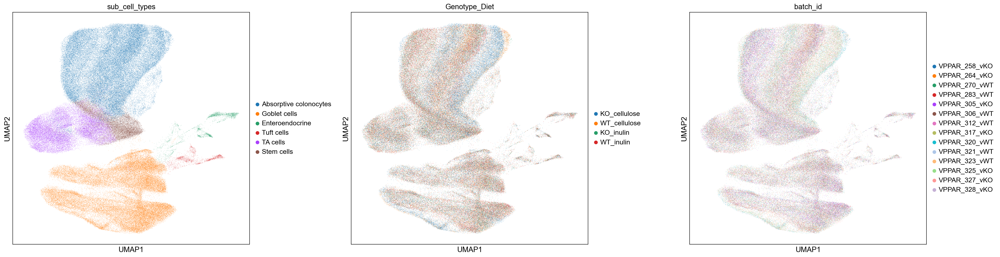

In [39]:
sc.set_figure_params(figsize=(8, 8)) 
sc.pl.umap(
    final_adata, color=['sub_cell_types', 'Genotype_Diet', 'batch_id'],
    wspace=0.3,
    save = "_sub_cell_types_n_batches_colonocytes.svg" 
)

findfont: Font family ['DejaVu Sans Display'] not found. Falling back to DejaVu Sans.


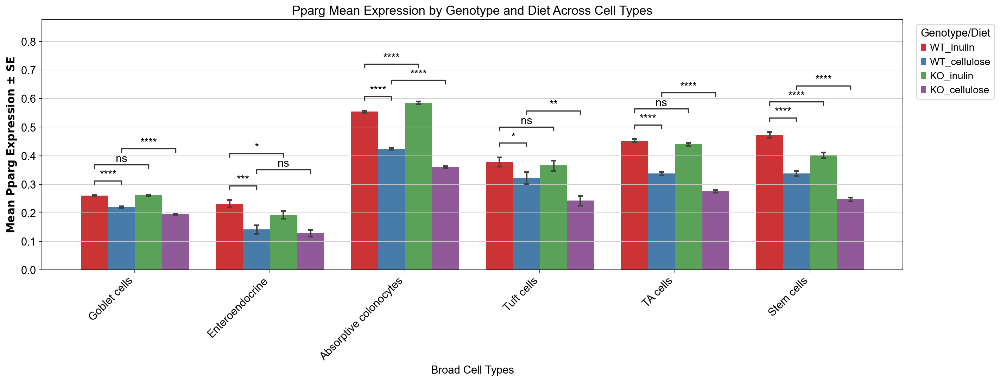

In [40]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

# --- Configuration ---
MIN_CELLS_PER_GROUP = 5 
Y_AXIS_MULTIPLIER = 1.5 # Multiplier for Y-axis limit
ANNOTATION_START_OFFSET = 0.15 

# Assuming 'final_adata' is your AnnData object containing all cells

# 1. Extract Pparg expression (make sure the gene is in adata.var_names)
pparg_expression = final_adata[:, 'Pparg'].X.toarray().flatten()

# 2. Create the plotting DataFrame, including 'sub_cell_types'
plot_df = pd.DataFrame({
    'sub_cell_types': final_adata.obs['sub_cell_types'].copy(), 
    'Genotype_Diet': final_adata.obs['Genotype_Diet'].copy(),
    'Pparg_Expression': pparg_expression
})

# Filter to the four groups of interest
diet_genotype_groups = ['WT_inulin', 'WT_cellulose', 'KO_inulin', 'KO_cellulose']
plot_df = plot_df[plot_df['Genotype_Diet'].isin(diet_genotype_groups)].copy()
plot_df['Genotype_Diet'] = pd.Categorical(plot_df['Genotype_Diet'], categories=diet_genotype_groups)

# --- 1. DEFINE ALL COMPARISON PAIRS ACROSS ALL CELL TYPES ---
cell_types = plot_df['sub_cell_types'].unique().tolist()

standard_pairs = [
    ('KO_inulin', 'WT_inulin'),      
    ('KO_cellulose', 'WT_cellulose'), 
    ('WT_inulin', 'WT_cellulose'),    
]

full_comparison_pairs = []
# FIX 1: Pass observed=False to silence FutureWarning
group_counts = plot_df.groupby(['sub_cell_types', 'Genotype_Diet'], observed=False).size()

for cell_type in cell_types:
    for groupA, groupB in standard_pairs:
        count_A = group_counts.get((cell_type, groupA), 0)
        count_B = group_counts.get((cell_type, groupB), 0)
        
        if count_A >= MIN_CELLS_PER_GROUP and count_B >= MIN_CELLS_PER_GROUP:
             full_comparison_pairs.append(((cell_type, groupA), (cell_type, groupB)))

# --- 2. PLOTTING WITH HUE AND FULL ANNOTATION ---
plt.figure(figsize=(18, 7))

ax = sns.barplot(
    data=plot_df, 
    x='sub_cell_types', 
    y='Pparg_Expression', 
    hue='Genotype_Diet', 
    hue_order=diet_genotype_groups,
    order=cell_types,
    # FIX 2: Replace deprecated ci=68 with errorbar=('ci', 68)
    errorbar=('ci', 68), 
    capsize=0.1, 
    palette='Set1'
)

# --- Add Wilcoxon Annotation using the full pair list ---
annotator = Annotator(
    ax, 
    full_comparison_pairs, 
    data=plot_df, 
    x='sub_cell_types', 
    y='Pparg_Expression',
    hue='Genotype_Diet',
    order=cell_types,
    hue_order=diet_genotype_groups
)

annotator.configure(
    test='Mann-Whitney', 
    text_format='star', 
    loc='inside', 
    verbose=0,
    
    # Use small positive offset to position annotations relative to bars
    line_offset_to_group=ANNOTATION_START_OFFSET, 
    line_offset=0.03 
)
annotator.apply_and_annotate()

# --- 3. Dynamic Y-axis calculation (for bar plots) ---
# FIX 3: Pass observed=False to silence FutureWarning
max_mean_all_bars = plot_df.groupby(['sub_cell_types', 'Genotype_Diet'], observed=False)['Pparg_Expression'].mean().max()

# Set the Y-axis limit using the multiplier
ax.set_ylim(0, max_mean_all_bars * Y_AXIS_MULTIPLIER) 

# Final Plot Polish
plt.title(f'Pparg Mean Expression by Genotype and Diet Across Cell Types', fontsize=16)
plt.ylabel('Mean Pparg Expression $\pm$ SE')
plt.xlabel('Broad Cell Types')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Genotype/Diet', bbox_to_anchor=(1.01, 1), loc='upper left') 
plt.tight_layout()
SVG_FILENAME = 'Pparg_Expression_Grouped_Barplot_subpops_cell_type.svg' # Define filename
plt.savefig(SVG_FILENAME, format='svg')
plt.show()

In [44]:
import gseapy as gp

# 1. Get the list of all available library names (pathways)
species='Mouse'
names = gp.get_library_name(organism=species)

# 2. Filter the list to find the desired libraries (case-insensitive)
kegg_libraries = [name for name in names if 'kegg' in name.lower()]
reactome_libraries = [name for name in names if 'reactome' in name.lower()]
go_bp_libraries = [name for name in names if 'biological_process' in name.lower()]

print(f"--- Total Libraries: {len(names)} ---\n")

print(f"KEGG Libraries Found ({len(kegg_libraries)}):")
print(kegg_libraries)
print("\nReactome Libraries Found:")
print(reactome_libraries)
print("\nGO Biological Process Libraries Found:")
print(go_bp_libraries)


--- Total Libraries: 225 ---

KEGG Libraries Found (7):
['KEGG_2013', 'KEGG_2015', 'KEGG_2016', 'KEGG_2019_Human', 'KEGG_2019_Mouse', 'KEGG_2021_Human', 'KEGG_2026']

Reactome Libraries Found:
['Reactome_2022', 'Reactome_Pathways_2024']

GO Biological Process Libraries Found:
['GO_Biological_Process_2021', 'GO_Biological_Process_2023', 'GO_Biological_Process_2025']


In [46]:
import scanpy as sc
import pandas as pd
import gseapy as gp
import os
import time 

# --- Configuration ---
DIETS = ['cellulose', 'inulin']
CELL_TYPE_COLUMN = 'sub_cell_types'
# NOTE: Adjusted GENE_SET_LIBRARIES for consistency with your corrected block
GENE_SET_LIBRARIES = ['GO_Biological_Process_2025', 'KEGG_2026', 'Reactome_Pathways_2024'] 

output_dir = './de_enrichr_excel_by_celltype' 
result_key = 'DE_comp'
N_GENES_FOR_ENRICHR = 250
SIG_PVAL = 0.05
LOGFC_CUTOFF = 0.5
os.makedirs(output_dir, exist_ok=True)

# --- Excel Name Constraints ---
MAX_COMP_LEN = 15  # Max length for comparison name prefix
MAX_LIB_LEN = 10   # Max length for library name suffix

# List of all unique cell types
# NOTE: final_adata must be defined before this line
all_cell_types = final_adata.obs[CELL_TYPE_COLUMN].cat.categories.tolist()
#all_cell_types = ["Stem cells"] # Keeping your example list

# --- Corrected Enrichr Function ---
def run_enrichr_and_save(writer, de_up_df, de_dn_df, comparison_name):
    """
    Runs Enrichr on both UP and DOWN lists, filters results by P-value and library, 
    saves to Excel with proper sheet names, and includes a short buffer time.
    """
    
    # === Enrichr for DE Up Genes ===
    gene_list_up = de_up_df.head(N_GENES_FOR_ENRICHR)['Gene'].tolist()
    if gene_list_up:
        print("    Running Enrichr for DE Up genes...")
        enr_up = gp.enrichr(gene_list=gene_list_up, gene_sets=GENE_SET_LIBRARIES, organism='Mouse', outdir=None, verbose=False)
        
        # Check if results are present at all
        if enr_up is not None and not enr_up.results.empty:
            full_results_df = enr_up.results
            short_comparison = comparison_name[:MAX_COMP_LEN] # Truncate comparison name once
            
            for library in GENE_SET_LIBRARIES:
                # 1. Filter the full results DataFrame by the current 'Gene_set' library name
                enr_res_lib = full_results_df[full_results_df['Gene_set'] == library].copy()

                # 2. Check for results
                if not enr_res_lib.empty:
                    # 3. Filter for significant results (Adjusted P-value < 0.05)
                    idx = enr_res_lib['Adjusted P-value'] < SIG_PVAL # Using the SIG_PVAL variable
                    enr_res_sig = enr_res_lib[idx].copy()

                    # 4. Check if there are significant results to save
                    if not enr_res_sig.empty:
                        # Construct the SAFE sheet name for UP genes
                        short_library = library[:MAX_LIB_LEN]
                        lib_sheet_name = f'{short_comparison}_Up_{short_library}' 
                        
                        print(f"      Saving significant pathways for library: {library} (Sheet: {lib_sheet_name})")
                        enr_res_sig.to_excel(writer, sheet_name=lib_sheet_name, index=False)

            print(f"    Enrichr pathways added for {len(gene_list_up)} UP genes.")
        else:
            print("    Enrichr for UP returned no results.")
    else:
        print("    Skipping Enrichr for UP: No significant DE up genes found.")

    # --- Buffer Time ---
    time.sleep(5) 
    # -------------------

    # === Enrichr for DE Down Genes ===
    gene_list_dn = de_dn_df.head(N_GENES_FOR_ENRICHR)['Gene'].tolist()
    if gene_list_dn:
        print("    Running Enrichr for DE Down genes...")
        enr_dn = gp.enrichr(gene_list=gene_list_dn, gene_sets=GENE_SET_LIBRARIES, organism='Mouse', outdir=None, verbose=False)
        
        # Check if results are present at all
        if enr_dn is not None and not enr_dn.results.empty:
            full_results_df = enr_dn.results
            short_comparison = comparison_name[:MAX_COMP_LEN] # Truncate comparison name once
            
            for library in GENE_SET_LIBRARIES:
                # 1. Filter the full results DataFrame by the current 'Gene_set' library name
                enr_res_lib = full_results_df[full_results_df['Gene_set'] == library].copy()

                # 2. Check for results
                if not enr_res_lib.empty:
                    # 3. Filter for significant results (Adjusted P-value < 0.05)
                    idx = enr_res_lib['Adjusted P-value'] < SIG_PVAL
                    enr_res_sig = enr_res_lib[idx].copy()

                    # 4. Check if there are significant results to save
                    if not enr_res_sig.empty:
                        # Construct the SAFE sheet name for DOWN genes
                        short_library = library[:MAX_LIB_LEN]
                        lib_sheet_name = f'{short_comparison}_Dn_{short_library}' 
                        
                        print(f"      Saving significant pathways for library: {library} (Sheet: {lib_sheet_name})")
                        enr_res_sig.to_excel(writer, sheet_name=lib_sheet_name, index=False)

            print(f"    Enrichr pathways added for {len(gene_list_dn)} DOWN genes.")
        else:
            print("    Enrichr for DOWN returned no results.")
    else:
        print("    Skipping Enrichr for DOWN: No significant DE down genes found.")
    
    time.sleep(5)

# --- 1. Outer Loop: Iterate by CELL TYPE (one Excel file per cell type) ---
for cell_type in all_cell_types:
    
    excel_filename = os.path.join(output_dir, f'DE_Enrichr_Results_{cell_type.replace(" ", "_")}.xlsx')
    
    print(f"\n=======================================================")
    print(f"Creating Excel for Cell Type: {cell_type}")
    print(f"=======================================================")
    
    # Use pandas.ExcelWriter context manager
    with pd.ExcelWriter(excel_filename, engine='xlsxwriter') as writer:
    
        # ==========================================================
        # SECTION 1: Genotype Comparisons (KO vs WT)
        # (This section is unchanged as it handles DE analysis and calls the function)
        # ==========================================================
        for diet in DIETS:
            
            # 1a. Define the specific groups for comparison
            test_group = f'KO_{diet}'   # Numerator (KO)
            ref_group = f'WT_{diet}'    # Denominator (WT)
            comparison_name = f'KO_vs_WT_{diet.capitalize()}'
            print(f"  --> Analyzing Genotype: {comparison_name}")

            # 1b. Create a subset (Assumes final_adata is defined)
            query = (final_adata.obs[CELL_TYPE_COLUMN] == cell_type) & \
                    (final_adata.obs['Genotype_Diet'].isin([ref_group, test_group]))
            adata_subset = final_adata[query, :].copy()
            
            if len(adata_subset.obs['Genotype_Diet'].unique()) < 2 or adata_subset.n_obs < 20:
                print(f"    Skipping: Not enough cells or groups for {diet}.")
                continue
                
            adata_subset.obs['Genotype_Diet'] = adata_subset.obs['Genotype_Diet'].cat.remove_unused_categories()
                
            # 1c. Run Wilcoxon DE Analysis
            sc.tl.rank_genes_groups(
                adata_subset, groupby='Genotype_Diet', groups=[test_group], 
                reference=ref_group, method='wilcoxon', use_raw=False,
                key_added=result_key, tie_correct=True,
            )
            
            # 1d. Extract ALL Results 
            result = adata_subset.uns[result_key]
            test_group_name = result['names'].dtype.names[0] 

            de_df_all = pd.DataFrame({
                'Gene': result['names'][test_group_name],
                'logfoldchanges': result['logfoldchanges'][test_group_name],
                'pvals': result['pvals'][test_group_name],
                'pvals_adj': result['pvals_adj'][test_group_name],
                'scores': result['scores'][test_group_name],
            })
            
            # 2. Filter DE Results
            de_up_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] > LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=False)
            
            de_dn_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] < -LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=True)

            print(f"    DE Up: {len(de_up_df)} genes | DE Down: {len(de_dn_df)} genes")
            
            # 3. Save DE Results to Excel (using comparison_name)
            de_up_df.to_excel(writer, sheet_name=f'{comparison_name}_Up', index=False)
            de_dn_df.to_excel(writer, sheet_name=f'{comparison_name}_Down', index=False)

            # 4. GSEApy (Enrichr) Analysis - Calling the function
            run_enrichr_and_save(writer, de_up_df, de_dn_df, comparison_name)
            
        # ==========================================================
        # SECTION 2: Diet Comparison (WT_inulin vs WT_cellulose)
        # (This section is unchanged as it handles DE analysis and calls the function)
        # ==========================================================
        
        # 1a. Define the specific groups for the new comparison
        test_group = 'WT_inulin'        # Numerator (Inulin)
        ref_group = 'WT_cellulose'      # Denominator (Cellulose)
        comparison_name = 'Inulin_vs_Cellulose_in_WT'
        print(f"\n  --> Analyzing Diet Effect: {comparison_name}")
        
        # 1b. Create a subset (Assumes final_adata is defined)
        query = (final_adata.obs[CELL_TYPE_COLUMN] == cell_type) & \
                (final_adata.obs['Genotype_Diet'].isin([ref_group, test_group]))
        adata_subset = final_adata[query, :].copy()
        
        if len(adata_subset.obs['Genotype_Diet'].unique()) < 2 or adata_subset.n_obs < 20:
            print(f"    Skipping: Not enough WT cells for Diet comparison.")
        else:
            adata_subset.obs['Genotype_Diet'] = adata_subset.obs['Genotype_Diet'].cat.remove_unused_categories()
            
            # 1c. Run Wilcoxon DE Analysis
            sc.tl.rank_genes_groups(
                adata_subset, groupby='Genotype_Diet', groups=[test_group], 
                reference=ref_group, method='wilcoxon', use_raw=False,
                key_added=result_key, tie_correct=True,
            )
            
            # 1d. Extract ALL Results (Manual Fix)
            result = adata_subset.uns[result_key]
            test_group_name = result['names'].dtype.names[0] 

            de_df_all = pd.DataFrame({
                'Gene': result['names'][test_group_name],
                'logfoldchanges': result['logfoldchanges'][test_group_name],
                'pvals': result['pvals'][test_group_name],
                'pvals_adj': result['pvals_adj'][test_group_name],
                'scores': result['scores'][test_group_name],
            })
            
            # 2. Filter DE Results
            de_up_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] > LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=False)
            
            de_dn_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] < -LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=True)

            print(f"    DE Up: {len(de_up_df)} genes | DE Down: {len(de_dn_df)} genes")

            # 3. Save DE Results to Excel (using comparison_name)
            de_up_df.to_excel(writer, sheet_name=f'{comparison_name}_Up', index=False)
            de_dn_df.to_excel(writer, sheet_name=f'{comparison_name}_Down', index=False)

            # 4. GSEApy (Enrichr) Analysis - Calling the function
            run_enrichr_and_save(writer, de_up_df, de_dn_df, comparison_name)
                
    print(f"\n✅ All analysis for {cell_type} consolidated and saved to: {excel_filename}")


Creating Excel for Cell Type: Absorptive colonocytes
  --> Analyzing Genotype: KO_vs_WT_Cellulose


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 449 genes | DE Down: 1267 genes
    Running Enrichr for DE Up genes...
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Cellul_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Cellul_Dn_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Cellul_Dn_Reactome_P)
    Enrichr pathways added for 250 DOWN genes.
  --> Analyzing Genotype: KO_vs_WT_Inulin


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 553 genes | DE Down: 654 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Up_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Up_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Inulin_Up_Reactome_P)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Dn_KEGG_2026)
    Enrichr pathways added for 250 DOWN genes.

  --> Analyzing Diet Effect: Inulin_vs_Cellulose_in_WT


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 927 genes | DE Down: 1438 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Up_GO_Biologi)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: Inulin_vs_Cellu_Dn_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: Inulin_vs_Cellu_Dn_Reactome_P)
    Enrichr pathways added for 250 DOWN genes.

✅ All analysis for Absorptive colonocytes consolidated and saved to: ./de_enrichr_excel_by_celltype\DE_Enrichr_Results_Absorptive_colonocytes.xlsx

Creating Excel for Cell Type: Goblet cells
  --> Analyzing Genotype: KO_vs_WT_Cellulose


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 368 genes | DE Down: 631 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Cellul_Up_Reactome_P)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Cellul_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Cellul_Dn_KEGG_2026)
    Enrichr pathways added for 250 DOWN genes.
  --> Analyzing Genotype: KO_vs_WT_Inulin


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 473 genes | DE Down: 386 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Up_GO_Biologi)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Dn_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Inulin_Dn_Reactome_P)
    Enrichr pathways added for 250 DOWN genes.

  --> Analyzing Diet Effect: Inulin_vs_Cellulose_in_WT


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 659 genes | DE Down: 1016 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Up_GO_Biologi)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: Inulin_vs_Cellu_Up_Reactome_P)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Dn_GO_Biologi)
    Enrichr pathways added for 250 DOWN genes.

✅ All analysis for Goblet cells consolidated and saved to: ./de_enrichr_excel_by_celltype\DE_Enrichr_Results_Goblet_cells.xlsx

Creating Excel for Cell Type: Enteroendocrine
  --> Analyzing Genotype: KO_vs_WT_Cellulose


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 20 genes | DE Down: 148 genes
    Running Enrichr for DE Up genes...
    Enrichr pathways added for 20 UP genes.
    Running Enrichr for DE Down genes...
    Enrichr pathways added for 148 DOWN genes.
  --> Analyzing Genotype: KO_vs_WT_Inulin


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 47 genes | DE Down: 99 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Up_GO_Biologi)
    Enrichr pathways added for 47 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Dn_KEGG_2026)
    Enrichr pathways added for 99 DOWN genes.

  --> Analyzing Diet Effect: Inulin_vs_Cellulose_in_WT


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 210 genes | DE Down: 762 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Up_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: Inulin_vs_Cellu_Up_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: Inulin_vs_Cellu_Up_Reactome_P)
    Enrichr pathways added for 210 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: Inulin_vs_Cellu_Dn_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: Inulin_vs_Cellu_Dn_Reactome_P)
    Enrichr pathways added for 250 DOWN genes.

✅ All analysis for Enteroendocrine consolidated and saved to: ./de_enrichr_excel_by_celltype\DE_Enrichr_Results_Enteroendocrine.xlsx

Creating Excel fo

c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 39 genes | DE Down: 154 genes
    Running Enrichr for DE Up genes...
    Enrichr pathways added for 39 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Cellul_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Cellul_Dn_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Cellul_Dn_Reactome_P)
    Enrichr pathways added for 154 DOWN genes.
  --> Analyzing Genotype: KO_vs_WT_Inulin


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 52 genes | DE Down: 69 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Up_GO_Biologi)
    Enrichr pathways added for 52 UP genes.
    Running Enrichr for DE Down genes...
    Enrichr pathways added for 69 DOWN genes.

  --> Analyzing Diet Effect: Inulin_vs_Cellulose_in_WT


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 174 genes | DE Down: 93 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Up_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: Inulin_vs_Cellu_Up_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: Inulin_vs_Cellu_Up_Reactome_P)
    Enrichr pathways added for 174 UP genes.
    Running Enrichr for DE Down genes...
    Enrichr pathways added for 93 DOWN genes.

✅ All analysis for Tuft cells consolidated and saved to: ./de_enrichr_excel_by_celltype\DE_Enrichr_Results_Tuft_cells.xlsx

Creating Excel for Cell Type: TA cells
  --> Analyzing Genotype: KO_vs_WT_Cellulose


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 429 genes | DE Down: 570 genes
    Running Enrichr for DE Up genes...
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Cellul_Dn_GO_Biologi)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Cellul_Dn_Reactome_P)
    Enrichr pathways added for 250 DOWN genes.
  --> Analyzing Genotype: KO_vs_WT_Inulin


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 327 genes | DE Down: 524 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Up_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Up_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Inulin_Up_Reactome_P)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Dn_KEGG_2026)
    Enrichr pathways added for 250 DOWN genes.

  --> Analyzing Diet Effect: Inulin_vs_Cellulose_in_WT


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 518 genes | DE Down: 910 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Up_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: Inulin_vs_Cellu_Up_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: Inulin_vs_Cellu_Up_Reactome_P)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
    Enrichr pathways added for 250 DOWN genes.

✅ All analysis for TA cells consolidated and saved to: ./de_enrichr_excel_by_celltype\DE_Enrichr_Results_TA_cells.xlsx

Creating Excel for Cell Type: Stem cells
  --> Analyzing Genotype: KO_vs_WT_Cellulose


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 268 genes | DE Down: 752 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Cellul_Up_GO_Biologi)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Cellul_Up_Reactome_P)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Cellul_Dn_GO_Biologi)
    Enrichr pathways added for 250 DOWN genes.
  --> Analyzing Genotype: KO_vs_WT_Inulin


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 217 genes | DE Down: 365 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Up_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Up_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Inulin_Up_Reactome_P)
    Enrichr pathways added for 217 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: KO_vs_WT_Inulin_Dn_GO_Biologi)
      Saving significant pathways for library: KEGG_2026 (Sheet: KO_vs_WT_Inulin_Dn_KEGG_2026)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: KO_vs_WT_Inulin_Dn_Reactome_P)
    Enrichr pathways added for 250 DOWN genes.

  --> Analyzing Diet Effect: Inulin_vs_Cellulose_in_WT


c:\Local_install\miniconda3\envs\scanpy_env_311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:317: RuntimeWarning: invalid value encountered in divide
  scores = (


    DE Up: 473 genes | DE Down: 876 genes
    Running Enrichr for DE Up genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Up_GO_Biologi)
    Enrichr pathways added for 250 UP genes.
    Running Enrichr for DE Down genes...
      Saving significant pathways for library: GO_Biological_Process_2025 (Sheet: Inulin_vs_Cellu_Dn_GO_Biologi)
      Saving significant pathways for library: Reactome_Pathways_2024 (Sheet: Inulin_vs_Cellu_Dn_Reactome_P)
    Enrichr pathways added for 250 DOWN genes.

✅ All analysis for Stem cells consolidated and saved to: ./de_enrichr_excel_by_celltype\DE_Enrichr_Results_Stem_cells.xlsx


In [ ]:
# Sub-annotation for Goblet Cells
idx = final_adata.obs['broad_cell_types'] == "Colonocytes"
final_adata = final_adata[idx,:].copy()
final_adata

In [ ]:
#sc.pp.highly_variable_genes(final_adata, n_top_genes=2000, batch_key="SampleID")# Flavor seurat
sc.pp.highly_variable_genes(final_adata, n_top_genes=2000)# Flavor seurat

#sc.pl.highly_variable_genes(adata, save="_hvgs_mean_disper.svg")
npca = 50

use_hvg = final_adata.var['highly_variable'].sum() > 0
if final_adata.n_obs > 20000:
    print(f"PCA analysis in chunks of 10000 cells (n_comps={npca})...")
    sc.tl.pca(final_adata, n_comps=npca, mask_var="highly_variable", chunked=True, chunk_size=10000, svd_solver="arpack")
else:
    print(f"PCA analysis (n_comps={npca})...")
    sc.tl.pca(final_adata, n_comps=npca, mask_var="highly_variable", chunked=False, svd_solver="arpack")

In [ ]:
sc.pl.pca_variance_ratio(final_adata, n_pcs=npca, log=True)

In [ ]:
import harmonypy as hp
import pandas as pd

# 1. Extract the PCA matrix
data_mat = final_adata.obsm['X_pca']

# 2. Run harmony directly
ho = hp.run_harmony(data_mat, final_adata.obs, 'SampleID')
print(f"X_pca shape: {final_adata.obsm['X_pca'].shape}")
print(f"X_pca_harmony shape: {ho.Z_corr.shape}")

# 3. Transpose and assign manually 
# Harmony returns (PCs x Cells), Scanpy expects (Cells x PCs)
final_adata.obsm['X_pca_harmony'] = ho.Z_corr

In [ ]:
# --- Custom Parameters ---
ndim = 2           # Number of UMAP dimensions
n_neighbors = 15   # Number of neighbors for the graph
my_res = 1.0       # Clustering resolution (changed from 2.0 to 1.0 as requested)
algo_cluster = "leidenalg"
npca = 50

# 5. Neighbors and UMAP (Step 8)
# This step uses the 50-component PCA result (final_adata.obsm['X_pca'])
print(f"Computing nearest neighbors (k={n_neighbors}) and UMAP (n_dims={ndim})...")
sc.pp.neighbors(final_adata, n_neighbors=n_neighbors, use_rep = "X_pca_harmony", n_pcs=npca, key_added="neighboars_harmony")
sc.pp.neighbors(final_adata, n_neighbors=n_neighbors, use_rep = "X_pca", n_pcs=npca) # Stored in neighboars

sc.tl.umap(final_adata, n_components=ndim, neighbors_key= "neighboars_harmony", maxiter=500)
final_adata.obsm['X_umap_harmony'] = final_adata.obsm['X_umap'] 
sc.tl.umap(final_adata, n_components=ndim, maxiter=500)
final_adata.obsm['X_umap_normal'] = final_adata.obsm['X_umap'] 
final_adata.obsm['X_umap'] = final_adata.obsm['X_umap_harmony'] 

In [ ]:
# 6. Global Leiden Clustering (Replacing Batch-Aware Clustering)
# This runs Leiden once on the entire graph structure computed from the 50 PCs.
cluster_key = f'leiden_global_{my_res}' # Renamed key to reflect global clustering
print(f"\nComputing **Global** Leiden clusters (res={my_res}, flavor={algo_cluster}) on all {final_adata.n_obs} cells...")

# sc.tl.leiden(
#     final_adata,
#     flavor=algo_cluster,
#     n_iterations=2, # Use n_iterations=2 as in the previous code
#     resolution=my_res,
#     key_added=cluster_key
# )
# print(f"Global Leiden clustering complete. Results in adata.obs['{cluster_key}']")

cluster_key = f'leiden_global_harmony_{my_res}' # Renamed key to reflect global clustering
print(f"\nComputing **Global** Leiden clusters (res={my_res}, flavor={algo_cluster}) on all {final_adata.n_obs} cells...")
sc.tl.leiden(
    final_adata,
    flavor=algo_cluster,
    n_iterations=2, # Use n_iterations=2 as in the previous code
    resolution=my_res,
    key_added=cluster_key,
    neighbors_key = "neighboars_harmony"
)

# 7. Plot and Save UMAP
#print(f"\nPlotting UMAP colored by {cluster_key} and saving...")
#sc.set_figure_params(figsize=(8, 8)) 
#sc.pl.umap(final_adata, color=[cluster_key], show=False, save=f"_umap_leiden_global.svg")
#sc.pl.umap(final_adata, color=[cluster_key], show=False, save=f"_umap_harmony_leiden_global.svg")

# The final H5AD save (Step 8) will automatically include all new results.

In [ ]:
sc.set_figure_params(figsize=(5, 5)) 
final_adata.obsm['X_umap'] = final_adata.obsm['X_umap_normal'] 
sc.pl.umap(
    final_adata, color=['Genotype_Diet'],
    wspace=0.1, 
    save = "_sub_cell_types_n_batches_colonocytes.svg" 
)

In [ ]:
sc.set_figure_params(figsize=(5, 5)) 
final_adata.obsm['X_umap'] = final_adata.obsm['X_umap_harmony'] 
sc.pl.umap(
    final_adata, color=['Genotype_Diet'],
    wspace=0.1, 
    save = "_sub_cell_types_n_batches_harmony_colonocytes.svg" 
)

In [ ]:
ndim = 2           # Number of UMAP dimensions
n_neighbors = 15   # Number of neighbors for the graph
algo_cluster = "leidenalg"

for res in [ 0.5, 0.7, 1.0, 1.5, 2.0, 2.5, 3.0]:
    sc.tl.leiden(final_adata, flavor=algo_cluster, n_iterations=2, resolution=res, key_added=f"leiden_res_{res:4.2f}", neighbors_key = "neighboars_harmony")

In [ ]:
# Sub annotation of goblet cells
marker_genes = {
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes": ["Alpi", "Ces2c", "Slc26a2", "Ceacam1", "Aqp8"],
    "Goblet cells": ["Muc2", "Spink4", "Agr2", "Tff3"],
    "Enteroendocrine": ["Chga", "Chgb", "Tph1", "Cck", "Scgn", "Scg5"],
    "Tuft cells": ["Dclk1", "Trpm5", "Avil", "Sh2d6", "Plcg2"],
    "TA cells": ["Mki67", "Top2a", "Birc5", "Pcna", "Stmn1"],
    "Stem cells": ["Lgr5", "Lrig1", "Ascl2", "Slc12a2", "Smoc2", "Kcnq1", "Gpx2",  "Ephb2", "Bmpr1a", "Hopx", "Sox9"],
    #"Mast cells": ["Ms4a2", "Cpa3", "Tpsab1", "Hpgds"],
    #"Adipocytes": ["Adipoq", "Plin1", "Plin4"],
}


In [ ]:
res = 2.5
cluster_key = f"leiden_res_{res:4.2f}"

sc.pl.dotplot(final_adata, marker_genes, #cmap='viridis', 
              groupby=cluster_key, standard_scale="var", save=f'_dotplot_markers_colonocytes_{cluster_key}.svg')

In [ ]:
sc.set_figure_params(figsize=(8, 8)) 
sc.pl.umap(
    final_adata, color=[cluster_key],
    legend_loc="on data",
    save = f"_cell_types_clusters_{cluster_key}_colonocytes.svg" )

In [ ]:
# MANUAL ANNOTATION OF GOBLET CELLS
#res = 2.5 
#cluster_key = f"leiden_res_{res:4.2f}"
level_ann = f"cell_type_clusters_{cluster_key}"
final_adata.obs[level_ann] = final_adata.obs[cluster_key].map(
    {
        "0": "Goblet cells",
        "1": "TA cells", 
        "2": "Absorptive colonocytes", 
        "3": "Goblet cells",
        "4": "Goblet cells",
        "5": "Absorptive colonocytes",
        "6": "Absorptive colonocytes",
        "7": "Absorptive colonocytes",
        "8": "Goblet cells", 
        "9": "Goblet cells", 
        "10": "TA cells",
        "11": "Absorptive colonocytes",
        "12": "Absorptive colonocytes", # Stem or abs col
        "13": "Goblet cells",
        "14": "Absorptive colonocytes", 
        "15": "Stem cells",
        "16": "TA cells",
        "17": "Stem cells",
        "18": "Stem cells",
        "19": "Absorptive colonocytes",
        "20": "Absorptive colonocytes",
        "21": "TA cells",
        "22": "TA cells",
        "23": "Absorptive colonocytes",
        "24": "Absorptive colonocytes",
        "25": "Goblet cells",
        "26": "Goblet cells",
        "27": "Absorptive colonocytes", 
        "28": "Absorptive colonocytes",
        "29": "Absorptive colonocytes",  
        "30": "Goblet cells",
        "31": "Goblet cells",
        "32": "Goblet cells",
        "33": "Goblet cells",
        "34": "Goblet cells",
        "35": "Stem cells", # stem or abs col
        "36": "Goblet cells",
        "37": "Enteroendocrine",
        "38": "Goblet cells", 
        "39": "Absorptive colonocytes", 
        "40": "Tuft cells", 
        "41": "Absorptive colonocytes",
        "42": "Goblet cells",
        "43": "Absorptive colonocytes", 
        "44": "Goblet cells",
        "45": "Absorptive colonocytes",
        "46": "Enteroendocrine",
        "47": "Enteroendocrine",
        "48": "Tuft cells",
        "49": "Goblet cells",
        "50": "TA cells",
        "51": "Absorptive colonocytes",
        "52": "Absorptive colonocytes",
    }
)

In [ ]:
# Display the resulting annotation and the top scores
print("\n--- New Cell Type Annotation Counts ---")
annotation_summary_df = summarize_annotations(final_adata, level_ann)

sc.set_figure_params(figsize=(8, 8)) 
sc.pl.umap(
    final_adata, color=[level_ann],
    save = "_cell_types_clusters_cust_ann_colonocytes.svg" )


In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc

# --- 2. Define the Custom Sort Order for SINGLE/LVL2 (Y-axis order) ---
# NOTE: This should be a list or tuple for ordered categories, not a set (curly braces used here denote a set, which is unordered).
custom_single_category_order = [
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes",
    "Goblet cells",
    "Enteroendocrine",
    "Tuft cells",
    "TA cells",
    "Stem cells",
]

# ==========================================================
# NEW SORTING AND PLOTTING FOR cell_type_lvl (SINGLE)
# ==========================================================
res = 2.5
level_ann = level_ann
cluster_key = f"leiden_res_{res:4.2f}"

# --- 5. Filter the Order to Match Existing Categories (LVL) ---
existing_categories_lvl = final_adata.obs[level_ann].cat.categories.tolist()
filtered_lvl_order = [cat for cat in custom_single_category_order if cat in existing_categories_lvl]

# Check for categories in the data that were missed in the custom list
missing_categories_lvl = [cat for cat in existing_categories_lvl if cat not in filtered_lvl_order]
if missing_categories_lvl:
    print(f"Warning (lvl): The following categories were not included in the custom sort list and will appear last: {missing_categories_lvl}")
    filtered_lvl_order.extend(missing_categories_lvl)


# --- 6. Apply the New Category Order to the obs column (LVL) ---
final_adata.obs[level_ann] = final_adata.obs[level_ann].cat.reorder_categories(filtered_lvl_order)

# --- 7. Plot the Data (LVL) ---
sc.pl.dotplot(
    final_adata, 
    marker_genes,  # Pass the dictionary to group and order the X-axis genes
    cmap='viridis', 
    groupby=level_ann, 
    standard_scale="var", 
    categories_order=custom_single_category_order,
    save=f'_dotplot_markers_colonocytes_{level_ann}.svg'
)

print(f"Dot plot categories for {level_ann} reordered successfully with diagonal alignment.")

In [ ]:
sc.pl.umap(
    final_adata, 
    color=["Mki67", "Top2a", "Pcna", "Stmn1", "Lgr5", "Ascl2", "Slc12a2", "Ephb2"], 
    use_raw=False,
    frameon=False,
    ncols=4,
    save='_ta_stem_gene_markers.svg' # Organize the plots into 2 columns
)

In [ ]:
#[ 0.2, 0.5, 0.7, 1.0]
res = 2.5
level_ann = "cell_type_lvl1"
cluster_key = f"leiden_res_{res:4.2f}"
# The actual call to execute the scoring and annotation:
final_adata, top5_df = weighted_annotation_score(
    adata=final_adata, 
    marker_genes=marker_genes, 
    cluster_key = cluster_key, 
    obs_key_string=level_ann,
    standardize_expression=True
)

# Display the resulting annotation and the top scores
print("\n--- New Cell Type Annotation Counts ---")
annotation_summary_df = summarize_annotations(final_adata, level_ann)

print("\n--- Top 5 Cell Scores per Cluster ---")
print(top5_df)
sc.set_figure_params(figsize=(8, 8)) 
sc.pl.umap(
    final_adata, color=[level_ann],
    save = "_cell_types_clusters_level3_colonocytes.svg" )

In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc

# --- 2. Define the Custom Sort Order for SINGLE/LVL2 (Y-axis order) ---
# NOTE: This should be a list or tuple for ordered categories, not a set (curly braces used here denote a set, which is unordered).
custom_single_category_order = [
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes",
    "Goblet cells",
    "Enteroendocrine",
    "Tuft cells",
    "TA cells",
    "Stem cells",
]

# ==========================================================
# NEW SORTING AND PLOTTING FOR cell_type_lvl (SINGLE)
# ==========================================================
res = 2.5
level_ann = level_ann
cluster_key = f"leiden_res_{res:4.2f}"

# --- 5. Filter the Order to Match Existing Categories (LVL) ---
existing_categories_lvl = final_adata.obs[level_ann].cat.categories.tolist()
filtered_lvl_order = [cat for cat in custom_single_category_order if cat in existing_categories_lvl]

# Check for categories in the data that were missed in the custom list
missing_categories_lvl = [cat for cat in existing_categories_lvl if cat not in filtered_lvl_order]
if missing_categories_lvl:
    print(f"Warning (lvl): The following categories were not included in the custom sort list and will appear last: {missing_categories_lvl}")
    filtered_lvl_order.extend(missing_categories_lvl)


# --- 6. Apply the New Category Order to the obs column (LVL) ---
final_adata.obs[level_ann] = final_adata.obs[level_ann].cat.reorder_categories(filtered_lvl_order)

# --- 7. Plot the Data (LVL) ---
sc.pl.dotplot(
    final_adata, 
    marker_genes,  # Pass the dictionary to group and order the X-axis genes
    cmap='viridis', 
    groupby=level_ann, 
    standard_scale="var", 
    categories_order=custom_single_category_order,
    save=f'_dotplot_markers_colonocytes_{level_ann}.svg'
)

print(f"Dot plot categories for {level_ann} reordered successfully with diagonal alignment.")

In [ ]:
level_ann = f"cell_type_clusters_{cluster_key}"

final_adata.obs['sub_cell_types'] = final_adata.obs[level_ann]

sc.pl.umap(
    final_adata, color=['sub_cell_types'],
    save = "_cell_types_clusters_cust_colonocytes.svg" )

In [ ]:
final_adata.obs['CellType'] = final_adata.obs['sub_cell_types']
final_adata.obs['BatchID'] = final_adata.obs['batch_id']

In [ ]:
# Sub annotation of colonocytes
marker_genes = {
    # ------------------ Epithelial Cells ------------------
    "Absorptive colonocytes": ["Alpi", "Ces2c", "Slc26a2", "Ceacam1", "Aqp8"],
    "Goblet cells": ["Muc2", "Spink4", "Agr2", "Tff3"],
    "Enteroendocrine": ["Chga", "Chgb", "Tph1", "Cck", "Scgn", "Scg5"],
    "Tuft cells": ["Dclk1", "Trpm5", "Avil", "Sh2d6", "Plcg2"],
    "TA cells": ["Mki67", "Top2a", "Birc5", "Pcna", "Stmn1"],
    "Stem cells": ["Lgr5", "Lrig1", "Ascl2", "Slc12a2", "Smoc2", "Kcnq1", "Gpx2", "Sox9",  "Ephb2", "Bmpr1a", "Hopx", 'Gp2', 'Ccl20'],
    #"Mast cells": ["Ms4a2", "Cpa3", "Tpsab1", "Hpgds"],
}


In [ ]:
print(final_adata)
FILE_NAME = 'iec_wu_scdc_merged_qc_processed_ann_colonocytes.h5ad'
print(f"\nSaving final broad cell type annotation AnnData to {FILE_NAME}")
final_adata.write_h5ad( FILE_NAME, compression=hdf5plugin.FILTERS["zstd"] )

In [ ]:
import scanpy as sc
import anndata as ad
import hdf5plugin
import os
import numpy as np
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# --- Configuration ---
# Define the root analysis path
ROOT_ANALYSIS_PATH = r"Z:\selim_working_dir\2025_wu_iec_project\scanpy_process\individual_files_process"

# Define the specific directory where the merged file is located (and where the output should go)
# This aligns with the 'ROOT_CB_OUTPUT_DIR' from the previous merging script.
INDIVIDUAL_SAMPLES_DIR = os.path.join(ROOT_ANALYSIS_PATH, 'individual_cellbender_samples')

# Change working directory to the target folder for reading/writing
os.chdir(INDIVIDUAL_SAMPLES_DIR)
print(f"Current Working Directory set to: {os.getcwd()}")

# File names (now relative to CWD)
FILE_NAME = 'iec_wu_scdc_merged_qc_processed_ann_colonocytes.h5ad'
batch_key = 'batch_id' 
fname_filtered = FILE_NAME

try:
    final_adata = sc.read_h5ad(fname_filtered)
    print(f"Loaded merged AnnData: {final_adata}")
except FileNotFoundError:
    print(f"Error: Merged input file not found at {fname_filtered} in the current directory.")
    exit()


In [ ]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

# --- Configuration ---
MIN_CELLS_PER_GROUP = 5 
Y_AXIS_MULTIPLIER = 1.5 # Multiplier for Y-axis limit
ANNOTATION_START_OFFSET = 0.15 

# Assuming 'final_adata' is your AnnData object containing all cells

# 1. Extract Pparg expression (make sure the gene is in adata.var_names)
pparg_expression = final_adata[:, 'Pparg'].X.toarray().flatten()

# 2. Create the plotting DataFrame, including 'sub_cell_types'
plot_df = pd.DataFrame({
    'sub_cell_types': final_adata.obs['sub_cell_types'].copy(), 
    'Genotype_Diet': final_adata.obs['Genotype_Diet'].copy(),
    'Pparg_Expression': pparg_expression
})

# Filter to the four groups of interest
diet_genotype_groups = ['WT_inulin', 'WT_cellulose', 'KO_inulin', 'KO_cellulose']
plot_df = plot_df[plot_df['Genotype_Diet'].isin(diet_genotype_groups)].copy()
plot_df['Genotype_Diet'] = pd.Categorical(plot_df['Genotype_Diet'], categories=diet_genotype_groups)

# --- 1. DEFINE ALL COMPARISON PAIRS ACROSS ALL CELL TYPES ---
cell_types = plot_df['sub_cell_types'].unique().tolist()

standard_pairs = [
    ('KO_inulin', 'WT_inulin'),      
    ('KO_cellulose', 'WT_cellulose'), 
    ('WT_inulin', 'WT_cellulose'),    
]

full_comparison_pairs = []
# FIX 1: Pass observed=False to silence FutureWarning
group_counts = plot_df.groupby(['sub_cell_types', 'Genotype_Diet'], observed=False).size()

for cell_type in cell_types:
    for groupA, groupB in standard_pairs:
        count_A = group_counts.get((cell_type, groupA), 0)
        count_B = group_counts.get((cell_type, groupB), 0)
        
        if count_A >= MIN_CELLS_PER_GROUP and count_B >= MIN_CELLS_PER_GROUP:
             full_comparison_pairs.append(((cell_type, groupA), (cell_type, groupB)))

# --- 2. PLOTTING WITH HUE AND FULL ANNOTATION ---
plt.figure(figsize=(18, 7))

ax = sns.barplot(
    data=plot_df, 
    x='sub_cell_types', 
    y='Pparg_Expression', 
    hue='Genotype_Diet', 
    hue_order=diet_genotype_groups,
    order=cell_types,
    # FIX 2: Replace deprecated ci=68 with errorbar=('ci', 68)
    errorbar=('ci', 68), 
    capsize=0.1, 
    palette='Set1'
)

# --- Add Wilcoxon Annotation using the full pair list ---
annotator = Annotator(
    ax, 
    full_comparison_pairs, 
    data=plot_df, 
    x='sub_cell_types', 
    y='Pparg_Expression',
    hue='Genotype_Diet',
    order=cell_types,
    hue_order=diet_genotype_groups
)

annotator.configure(
    test='Mann-Whitney', 
    text_format='star', 
    loc='inside', 
    verbose=0,
    
    # Use small positive offset to position annotations relative to bars
    line_offset_to_group=ANNOTATION_START_OFFSET, 
    line_offset=0.03 
)
annotator.apply_and_annotate()

# --- 3. Dynamic Y-axis calculation (for bar plots) ---
# FIX 3: Pass observed=False to silence FutureWarning
max_mean_all_bars = plot_df.groupby(['sub_cell_types', 'Genotype_Diet'], observed=False)['Pparg_Expression'].mean().max()

# Set the Y-axis limit using the multiplier
ax.set_ylim(0, max_mean_all_bars * Y_AXIS_MULTIPLIER) 

# Final Plot Polish
plt.title(f'Pparg Mean Expression by Genotype and Diet Across Cell Types', fontsize=16)
plt.ylabel('Mean Pparg Expression $\pm$ SE')
plt.xlabel('Broad Cell Types')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Genotype/Diet', bbox_to_anchor=(1.01, 1), loc='upper left') 
plt.tight_layout()
SVG_FILENAME = 'Pparg_Expression_Grouped_Barplot_subpops_cell_type.svg' # Define filename
plt.savefig(SVG_FILENAME, format='svg')
plt.show()

In [ ]:
import gseapy as gp

# 1. Get the list of all available library names (pathways)
species='Mouse'
names = gp.get_library_name(organism=species)

# 2. Filter the list to find the desired libraries (case-insensitive)
kegg_libraries = [name for name in names if 'kegg' in name.lower()]
reactome_libraries = [name for name in names if 'reactome' in name.lower()]
go_bp_libraries = [name for name in names if 'biological_process' in name.lower()]

print(f"--- Total Libraries: {len(names)} ---\n")

print(f"KEGG Libraries Found ({len(kegg_libraries)}):")
print(kegg_libraries)
print("\nReactome Libraries Found:")
print(reactome_libraries)
print("\nGO Biological Process Libraries Found:")
print(go_bp_libraries)


In [ ]:
import scanpy as sc
import pandas as pd
import gseapy as gp
import os
import time 

# --- Configuration ---
DIETS = ['cellulose', 'inulin']
CELL_TYPE_COLUMN = 'sub_cell_types'
# NOTE: Adjusted GENE_SET_LIBRARIES for consistency with your corrected block
GENE_SET_LIBRARIES = ['GO_Biological_Process_2025', 'KEGG_2026', 'Reactome_Pathways_2024'] 

output_dir = './de_enrichr_excel_by_celltype' 
result_key = 'DE_comp'
N_GENES_FOR_ENRICHR = 250
SIG_PVAL = 0.05
LOGFC_CUTOFF = 0.5
os.makedirs(output_dir, exist_ok=True)

# --- Excel Name Constraints ---
MAX_COMP_LEN = 15  # Max length for comparison name prefix
MAX_LIB_LEN = 10   # Max length for library name suffix

# List of all unique cell types
# NOTE: final_adata must be defined before this line
all_cell_types = final_adata.obs[CELL_TYPE_COLUMN].cat.categories.tolist()
#all_cell_types = ["Stem cells"] # Keeping your example list

# --- Corrected Enrichr Function ---
def run_enrichr_and_save(writer, de_up_df, de_dn_df, comparison_name):
    """
    Runs Enrichr on both UP and DOWN lists, filters results by P-value and library, 
    saves to Excel with proper sheet names, and includes a short buffer time.
    """
    
    # === Enrichr for DE Up Genes ===
    gene_list_up = de_up_df.head(N_GENES_FOR_ENRICHR)['Gene'].tolist()
    if gene_list_up:
        print("    Running Enrichr for DE Up genes...")
        enr_up = gp.enrichr(gene_list=gene_list_up, gene_sets=GENE_SET_LIBRARIES, organism='Mouse', outdir=None, verbose=False)
        
        # Check if results are present at all
        if enr_up is not None and not enr_up.results.empty:
            full_results_df = enr_up.results
            short_comparison = comparison_name[:MAX_COMP_LEN] # Truncate comparison name once
            
            for library in GENE_SET_LIBRARIES:
                # 1. Filter the full results DataFrame by the current 'Gene_set' library name
                enr_res_lib = full_results_df[full_results_df['Gene_set'] == library].copy()

                # 2. Check for results
                if not enr_res_lib.empty:
                    # 3. Filter for significant results (Adjusted P-value < 0.05)
                    idx = enr_res_lib['Adjusted P-value'] < SIG_PVAL # Using the SIG_PVAL variable
                    enr_res_sig = enr_res_lib[idx].copy()

                    # 4. Check if there are significant results to save
                    if not enr_res_sig.empty:
                        # Construct the SAFE sheet name for UP genes
                        short_library = library[:MAX_LIB_LEN]
                        lib_sheet_name = f'{short_comparison}_Up_{short_library}' 
                        
                        print(f"      Saving significant pathways for library: {library} (Sheet: {lib_sheet_name})")
                        enr_res_sig.to_excel(writer, sheet_name=lib_sheet_name, index=False)

            print(f"    Enrichr pathways added for {len(gene_list_up)} UP genes.")
        else:
            print("    Enrichr for UP returned no results.")
    else:
        print("    Skipping Enrichr for UP: No significant DE up genes found.")

    # --- Buffer Time ---
    time.sleep(5) 
    # -------------------

    # === Enrichr for DE Down Genes ===
    gene_list_dn = de_dn_df.head(N_GENES_FOR_ENRICHR)['Gene'].tolist()
    if gene_list_dn:
        print("    Running Enrichr for DE Down genes...")
        enr_dn = gp.enrichr(gene_list=gene_list_dn, gene_sets=GENE_SET_LIBRARIES, organism='Mouse', outdir=None, verbose=False)
        
        # Check if results are present at all
        if enr_dn is not None and not enr_dn.results.empty:
            full_results_df = enr_dn.results
            short_comparison = comparison_name[:MAX_COMP_LEN] # Truncate comparison name once
            
            for library in GENE_SET_LIBRARIES:
                # 1. Filter the full results DataFrame by the current 'Gene_set' library name
                enr_res_lib = full_results_df[full_results_df['Gene_set'] == library].copy()

                # 2. Check for results
                if not enr_res_lib.empty:
                    # 3. Filter for significant results (Adjusted P-value < 0.05)
                    idx = enr_res_lib['Adjusted P-value'] < SIG_PVAL
                    enr_res_sig = enr_res_lib[idx].copy()

                    # 4. Check if there are significant results to save
                    if not enr_res_sig.empty:
                        # Construct the SAFE sheet name for DOWN genes
                        short_library = library[:MAX_LIB_LEN]
                        lib_sheet_name = f'{short_comparison}_Dn_{short_library}' 
                        
                        print(f"      Saving significant pathways for library: {library} (Sheet: {lib_sheet_name})")
                        enr_res_sig.to_excel(writer, sheet_name=lib_sheet_name, index=False)

            print(f"    Enrichr pathways added for {len(gene_list_dn)} DOWN genes.")
        else:
            print("    Enrichr for DOWN returned no results.")
    else:
        print("    Skipping Enrichr for DOWN: No significant DE down genes found.")
    
    time.sleep(5)

# --- 1. Outer Loop: Iterate by CELL TYPE (one Excel file per cell type) ---
for cell_type in all_cell_types:
    
    excel_filename = os.path.join(output_dir, f'DE_Enrichr_Results_{cell_type.replace(" ", "_")}.xlsx')
    
    print(f"\n=======================================================")
    print(f"Creating Excel for Cell Type: {cell_type}")
    print(f"=======================================================")
    
    # Use pandas.ExcelWriter context manager
    with pd.ExcelWriter(excel_filename, engine='xlsxwriter') as writer:
    
        # ==========================================================
        # SECTION 1: Genotype Comparisons (KO vs WT)
        # (This section is unchanged as it handles DE analysis and calls the function)
        # ==========================================================
        for diet in DIETS:
            
            # 1a. Define the specific groups for comparison
            test_group = f'KO_{diet}'   # Numerator (KO)
            ref_group = f'WT_{diet}'    # Denominator (WT)
            comparison_name = f'KO_vs_WT_{diet.capitalize()}'
            print(f"  --> Analyzing Genotype: {comparison_name}")

            # 1b. Create a subset (Assumes final_adata is defined)
            query = (final_adata.obs[CELL_TYPE_COLUMN] == cell_type) & \
                    (final_adata.obs['Genotype_Diet'].isin([ref_group, test_group]))
            adata_subset = final_adata[query, :].copy()
            
            if len(adata_subset.obs['Genotype_Diet'].unique()) < 2 or adata_subset.n_obs < 20:
                print(f"    Skipping: Not enough cells or groups for {diet}.")
                continue
                
            adata_subset.obs['Genotype_Diet'] = adata_subset.obs['Genotype_Diet'].cat.remove_unused_categories()
                
            # 1c. Run Wilcoxon DE Analysis
            sc.tl.rank_genes_groups(
                adata_subset, groupby='Genotype_Diet', groups=[test_group], 
                reference=ref_group, method='wilcoxon', use_raw=False,
                key_added=result_key, tie_correct=True,
            )
            
            # 1d. Extract ALL Results 
            result = adata_subset.uns[result_key]
            test_group_name = result['names'].dtype.names[0] 

            de_df_all = pd.DataFrame({
                'Gene': result['names'][test_group_name],
                'logfoldchanges': result['logfoldchanges'][test_group_name],
                'pvals': result['pvals'][test_group_name],
                'pvals_adj': result['pvals_adj'][test_group_name],
                'scores': result['scores'][test_group_name],
            })
            
            # 2. Filter DE Results
            de_up_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] > LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=False)
            
            de_dn_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] < -LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=True)

            print(f"    DE Up: {len(de_up_df)} genes | DE Down: {len(de_dn_df)} genes")
            
            # 3. Save DE Results to Excel (using comparison_name)
            de_up_df.to_excel(writer, sheet_name=f'{comparison_name}_Up', index=False)
            de_dn_df.to_excel(writer, sheet_name=f'{comparison_name}_Down', index=False)

            # 4. GSEApy (Enrichr) Analysis - Calling the function
            run_enrichr_and_save(writer, de_up_df, de_dn_df, comparison_name)
            
        # ==========================================================
        # SECTION 2: Diet Comparison (WT_inulin vs WT_cellulose)
        # (This section is unchanged as it handles DE analysis and calls the function)
        # ==========================================================
        
        # 1a. Define the specific groups for the new comparison
        test_group = 'WT_inulin'        # Numerator (Inulin)
        ref_group = 'WT_cellulose'      # Denominator (Cellulose)
        comparison_name = 'Inulin_vs_Cellulose_in_WT'
        print(f"\n  --> Analyzing Diet Effect: {comparison_name}")
        
        # 1b. Create a subset (Assumes final_adata is defined)
        query = (final_adata.obs[CELL_TYPE_COLUMN] == cell_type) & \
                (final_adata.obs['Genotype_Diet'].isin([ref_group, test_group]))
        adata_subset = final_adata[query, :].copy()
        
        if len(adata_subset.obs['Genotype_Diet'].unique()) < 2 or adata_subset.n_obs < 20:
            print(f"    Skipping: Not enough WT cells for Diet comparison.")
        else:
            adata_subset.obs['Genotype_Diet'] = adata_subset.obs['Genotype_Diet'].cat.remove_unused_categories()
            
            # 1c. Run Wilcoxon DE Analysis
            sc.tl.rank_genes_groups(
                adata_subset, groupby='Genotype_Diet', groups=[test_group], 
                reference=ref_group, method='wilcoxon', use_raw=False,
                key_added=result_key, tie_correct=True,
            )
            
            # 1d. Extract ALL Results (Manual Fix)
            result = adata_subset.uns[result_key]
            test_group_name = result['names'].dtype.names[0] 

            de_df_all = pd.DataFrame({
                'Gene': result['names'][test_group_name],
                'logfoldchanges': result['logfoldchanges'][test_group_name],
                'pvals': result['pvals'][test_group_name],
                'pvals_adj': result['pvals_adj'][test_group_name],
                'scores': result['scores'][test_group_name],
            })
            
            # 2. Filter DE Results
            de_up_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] > LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=False)
            
            de_dn_df = de_df_all[
                (de_df_all['pvals_adj'] < SIG_PVAL) & 
                (de_df_all['logfoldchanges'] < -LOGFC_CUTOFF) 
            ].sort_values('logfoldchanges', ascending=True)

            print(f"    DE Up: {len(de_up_df)} genes | DE Down: {len(de_dn_df)} genes")

            # 3. Save DE Results to Excel (using comparison_name)
            de_up_df.to_excel(writer, sheet_name=f'{comparison_name}_Up', index=False)
            de_dn_df.to_excel(writer, sheet_name=f'{comparison_name}_Down', index=False)

            # 4. GSEApy (Enrichr) Analysis - Calling the function
            run_enrichr_and_save(writer, de_up_df, de_dn_df, comparison_name)
                
    print(f"\n✅ All analysis for {cell_type} consolidated and saved to: {excel_filename}")